
## ***Text Data - Sentiment Analysis***


---







**Data Description**

 This dataset consists of reviews of fine foods from amazon. The data span a period of more than 10 years, including all ~500,000 reviews up to October 2012. Reviews include product and user information, ratings, and a plain text review. It also includes reviews from all other Amazon categories.

**Data includes:**

- Reviews from Oct 1999 - Oct 2012 - 568,454 reviews
- 256,059 Users and 74,258 products
- 260 users with > 50 reviews


**Problem Statement :**

The aim here will be to `predict the score for the given text review` by an individual for the product he brought on amazon.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!unzip '/content/drive/MyDrive/text_project/txt_reviews.zip' -d '/content/Temp file'

Streaming output truncated to the last 5000 lines.
  inflating: /content/Temp file/txt_reviews/review_95499.txt  
  inflating: /content/Temp file/txt_reviews/review_955.txt  
  inflating: /content/Temp file/txt_reviews/review_9550.txt  
  inflating: /content/Temp file/txt_reviews/review_95500.txt  
  inflating: /content/Temp file/txt_reviews/review_95501.txt  
  inflating: /content/Temp file/txt_reviews/review_95502.txt  
  inflating: /content/Temp file/txt_reviews/review_95503.txt  
  inflating: /content/Temp file/txt_reviews/review_95504.txt  
  inflating: /content/Temp file/txt_reviews/review_95505.txt  
  inflating: /content/Temp file/txt_reviews/review_95506.txt  
  inflating: /content/Temp file/txt_reviews/review_95507.txt  
  inflating: /content/Temp file/txt_reviews/review_95508.txt  
  inflating: /content/Temp file/txt_reviews/review_95509.txt  
  inflating: /content/Temp file/txt_reviews/review_9551.txt  
  inflating: /content/Temp file/txt_reviews/review_95510.txt  
  inflat

 **Create DataFrame**

In [ ]:
import os
import pandas as pd
import re
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
root_dir ='/content/Temp file/txt_reviews'

In [ ]:
file_name = os.listdir(root_dir)
print('Total number of files in the dataset:',len(file_name))

Total number of files in the dataset: 568454


In [ ]:
ProductId = []
UserId = []
ProfileName = []
HelpfulnessNumerator = []
HelpfulnessDenominator = []
Score = []
Time = []
ReviewSummary = []
ReviewText = []

for review in file_name:
    with open(os.path.join(root_dir,review),'rt') as f:
        lines = f.readlines()
        ProductId.append(lines[0].split(":")[1].strip('\n'))
        UserId.append(lines[1].split(":")[1].strip('\n'))
        ProfileName.append(lines[2].split(":")[1].strip('\n'))
        HelpfulnessNumerator.append(lines[3].split(":")[1].strip('\n'))
        HelpfulnessDenominator.append(lines[4].split(":")[1].strip('\n'))
        Score.append(lines[5].split(":")[1].strip('\n'))
        Time.append(lines[6].split(":")[1].strip('\n'))
        ReviewSummary.append(lines[7].split(":")[1].strip('\n'))
        ReviewText.append(lines[8].split(":")[1].strip('\n'))

df = pd.DataFrame({'ProductId':ProductId,
                 'UserId':UserId,
                 'ProfileName':ProfileName,
                 'HelpfulnessNumerator':HelpfulnessNumerator,
                 'HelpfulnessDenominator':HelpfulnessDenominator,
                 'Score':Score,
                 'Time':Time,
                 'ReviewSummary':ReviewSummary,
                 'ReviewText':ReviewText})

df.head()

,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,ReviewSummary,ReviewText
0,B000UU8KA2,A3PTDVALS7JJGA,vicop69,0,0,5,1318896000,Rain-Blo Gum,This is the best gum ever. They make smaller ...
1,B0002DGRRA,A38AN6ZRMHV6EU,Carole S. Stabile,0,0,5,1243382400,Happy Dog,This is a healthy and good snack for my dog. ...
2,B008JHZ150,A1F7YU6O5RU432,Angela Streiff,1,1,5,1347580800,A delicious hot sauce with some flavor,I love that this Tabanero hot sauce actually ...
3,B000EH4XZM,AQ1G6JEBH5QWY,Ms. Diane C. Frandsen,0,0,4,1224806400,rice review,love this product. very good quality. The fla...
4,B00024D9X4,A1P85GZIZSL9IE,"Julia Osborn ""texasmom""",1,1,1,1301097600,Yuk!,This is by far the nastiest thing I have ever...


In [ ]:
df.to_csv("/content/drive/MyDrive/text_reviews_csv.csv")

In [ ]:
df_review = pd.read_csv('/content/drive/MyDrive/text_reviews_csv.csv')

In [ ]:
df_review.head()

,Unnamed: 0,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,ReviewSummary,ReviewText
0,0,B000UU8KA2,A3PTDVALS7JJGA,vicop69,0,0,5,1318896000,Rain-Blo Gum,This is the best gum ever. They make smaller ...
1,1,B0002DGRRA,A38AN6ZRMHV6EU,Carole S. Stabile,0,0,5,1243382400,Happy Dog,This is a healthy and good snack for my dog. ...
2,2,B008JHZ150,A1F7YU6O5RU432,Angela Streiff,1,1,5,1347580800,A delicious hot sauce with some flavor,I love that this Tabanero hot sauce actually ...
3,3,B000EH4XZM,AQ1G6JEBH5QWY,Ms. Diane C. Frandsen,0,0,4,1224806400,rice review,love this product. very good quality. The fla...
4,4,B00024D9X4,A1P85GZIZSL9IE,"Julia Osborn ""texasmom""",1,1,1,1301097600,Yuk!,This is by far the nastiest thing I have ever...


In [ ]:
df_review.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 568454 entries, 0 to 568453
Data columns (total 10 columns):
 #   Column                  Non-Null Count   Dtype 
---  ------                  --------------   ----- 
 0   Unnamed: 0              568454 non-null  int64 
 1   ProductId               568454 non-null  object
 2   UserId                  568454 non-null  object
 3   ProfileName             568454 non-null  object
 4   HelpfulnessNumerator    568454 non-null  int64 
 5   HelpfulnessDenominator  568454 non-null  int64 
 6   Score                   568454 non-null  int64 
 7   Time                    568454 non-null  int64 
 8   ReviewSummary           568454 non-null  object
 9   ReviewText              568454 non-null  object
dtypes: int64(5), object(5)
memory usage: 43.4+ MB


In [ ]:
df_review.Time = df_review.Time.astype('int64')

In [ ]:
df_review["Time"]=df_review["Time"].apply(lambda x:''.join(re.findall('(.*)T',datetime.fromtimestamp(x).isoformat())))


In [ ]:
df_review.Time = pd.to_datetime(df_review.Time)

In [ ]:
df_review.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 568454 entries, 0 to 568453
Data columns (total 10 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   Unnamed: 0              568454 non-null  int64         
 1   ProductId               568454 non-null  object        
 2   UserId                  568454 non-null  object        
 3   ProfileName             568454 non-null  object        
 4   HelpfulnessNumerator    568454 non-null  int64         
 5   HelpfulnessDenominator  568454 non-null  int64         
 6   Score                   568454 non-null  int64         
 7   Time                    568454 non-null  datetime64[ns]
 8   ReviewSummary           568454 non-null  object        
 9   ReviewText              568454 non-null  object        
dtypes: datetime64[ns](1), int64(4), object(5)
memory usage: 43.4+ MB


In [ ]:
df_review.isna().sum()

Unnamed: 0                0
ProductId                 0
UserId                    0
ProfileName               0
HelpfulnessNumerator      0
HelpfulnessDenominator    0
Score                     0
Time                      0
ReviewSummary             0
ReviewText                0
dtype: int64

In [ ]:
df_review.shape

(568454, 10)

In [ ]:
df_review.describe()

,Unnamed: 0,HelpfulnessNumerator,HelpfulnessDenominator,Score
count,568454.000000,568454.000000,568454.00000,568454.000000
mean,284226.500000,1.743817,2.22881,4.183199
std,164098.679298,7.636513,8.28974,1.310436
min,0.000000,0.000000,0.00000,1.000000
25%,142113.250000,0.000000,0.00000,4.000000
50%,284226.500000,0.000000,1.00000,5.000000
75%,426339.750000,2.000000,2.00000,5.000000
max,568453.000000,866.000000,923.00000,5.000000


In [ ]:
df_review.duplicated().sum()

0

**Exploratory Data Analysis**

In [ ]:
df_review['Score'].value_counts()

5    363122
4     80655
1     52268
3     42640
2     29769
Name: Score, dtype: int64

In [ ]:
df_review['Score'].value_counts(normalize=True)

5    0.638789
4    0.141885
1    0.091948
3    0.075010
2    0.052368
Name: Score, dtype: float64

<AxesSubplot:xlabel='Score', ylabel='count'>

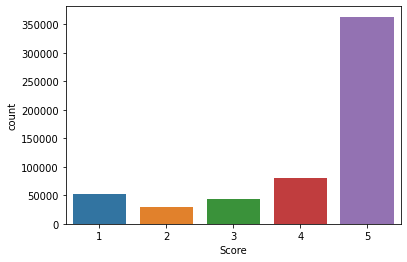

In [ ]:
sns.countplot(x='Score', data=df_review)

In [ ]:
df_review.columns

Index(['Unnamed: 0', 'ProductId', 'UserId', 'ProfileName',
       'HelpfulnessNumerator', 'HelpfulnessDenominator', 'Score', 'Time',
       'ReviewSummary', 'ReviewText'],
      dtype='object')

In [ ]:
df_review = df_review.drop('Unnamed: 0', axis = 1)

In [ ]:
df_review.columns

Index(['ProductId', 'UserId', 'ProfileName', 'HelpfulnessNumerator',
       'HelpfulnessDenominator', 'Score', 'Time', 'ReviewSummary',
       'ReviewText'],
      dtype='object')

In [ ]:
df_review.loc[df_review['Score']<3,'Score']=0
df_review.loc[df_review['Score']>3,'Score']=1

In [ ]:
df_review = df_review[df_review['Score']!=3]

In [ ]:
df_review.head()

,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,ReviewSummary,ReviewText
0,B000UU8KA2,A3PTDVALS7JJGA,vicop69,0,0,1,2011-10-18,Rain-Blo Gum,This is the best gum ever. They make smaller ...
1,B0002DGRRA,A38AN6ZRMHV6EU,Carole S. Stabile,0,0,1,2009-05-27,Happy Dog,This is a healthy and good snack for my dog. ...
2,B008JHZ150,A1F7YU6O5RU432,Angela Streiff,1,1,1,2012-09-14,A delicious hot sauce with some flavor,I love that this Tabanero hot sauce actually ...
3,B000EH4XZM,AQ1G6JEBH5QWY,Ms. Diane C. Frandsen,0,0,1,2008-10-24,rice review,love this product. very good quality. The fla...
4,B00024D9X4,A1P85GZIZSL9IE,"Julia Osborn ""texasmom""",1,1,0,2011-03-26,Yuk!,This is by far the nastiest thing I have ever...


In [ ]:
df_review.shape

(525814, 9)

In [ ]:
df_review.duplicated().sum()

262

In [ ]:
df_review.drop_duplicates(inplace=True)

In [ ]:
df_review.duplicated().sum()

0

**Data Prepration - Text Preprocessing**

In [ ]:
import re
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer

nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


True

In [ ]:
## initialise the inbuilt Stemmer
stemmer = PorterStemmer()

In [ ]:
# we can also use lemmatizer instead of stemmer
lemmatizer = WordNetLemmatizer()

In [ ]:
def preprocess(raw_text, flag):
    # Removing special characters and digits
    sentence = re.sub("[^a-zA-Z]", " ", raw_text)

    # change sentence to lower case
    sentence = sentence.lower()

    # tokenize into words
    tokens = sentence.split()

    # remove stop words
    clean_tokens = [t for t in tokens if not t in stopwords.words("english")]

    # Stemming/Lemmatization
    if(flag == 'stem'):
        clean_tokens = [stemmer.stem(word) for word in clean_tokens]
    else:
        clean_tokens = [lemmatizer.lemmatize(word) for word in clean_tokens]

    return pd.Series([" ".join(clean_tokens), len(clean_tokens)])

In [ ]:
from tqdm import tqdm, tqdm_notebook
tqdm.pandas()

In [ ]:
temp_df = df_review['ReviewText'].progress_apply(lambda x: preprocess(x, 'lemma'))

100%|██████████| 525552/525552 [1:37:22<00:00, 89.96it/s]


In [ ]:
temp_df

,0,1,Score
0,best gum ever make smaller size go little stuf...,11,1
1,healthy good snack dog great training produst ...,13,1
2,love tabanero hot sauce actually flavor adding...,68,1
3,love product good quality flavor excellent lik...,12,1
4,far nastiest thing ever put mouth husband eat ...,25,0
...,...,...,...
568449,good product still growing purchase year ago p...,10,1
568450,greenies great dental chew keep dog minimal pl...,39,1
568451,expecting much found box big lot actually quit...,33,1
568452,started month old son partially breastfed regu...,67,0


In [ ]:
temp_df.columns = ['Review_clean_text','count','Score']

In [ ]:
temp_df = temp_df.drop('count', axis = 1)

In [ ]:
temp_df

,Review_clean_text,Score
0,best gum ever make smaller size go little stuf...,1
1,healthy good snack dog great training produst ...,1
2,love tabanero hot sauce actually flavor adding...,1
3,love product good quality flavor excellent lik...,1
4,far nastiest thing ever put mouth husband eat ...,0
...,...,...
568449,good product still growing purchase year ago p...,1
568450,greenies great dental chew keep dog minimal pl...,1
568451,expecting much found box big lot actually quit...,1
568452,started month old son partially breastfed regu...,0


In [ ]:
temp_df.isnull().sum()

Review_clean_text    0
Score                0
dtype: int64

In [ ]:
temp_df.to_csv('/content/drive/MyDrive/text_project.csv')

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/text_project.csv')

In [ ]:
df.shape

(525552, 3)

In [ ]:
df.head()

,Unnamed: 0,Review_clean_text,Score
0,0,best gum ever make smaller size go little stuf...,1
1,1,healthy good snack dog great training produst ...,1
2,2,love tabanero hot sauce actually flavor adding...,1
3,3,love product good quality flavor excellent lik...,1
4,4,far nastiest thing ever put mouth husband eat ...,0


In [ ]:
df = df.drop('Unnamed: 0', axis = 1)

In [ ]:
df.duplicated().sum()

164564

In [ ]:
df.drop_duplicates(inplace=True)

In [ ]:
df.duplicated().sum()

0

In [ ]:
df.isnull().sum()

Review_clean_text    2
Score                0
dtype: int64

In [ ]:
df.dropna(inplace = True)

In [ ]:
df.isnull().sum()

Review_clean_text    0
Score                0
dtype: int64

**Data Preparation - Split the data into train and test set**

In [ ]:
X = df[['Review_clean_text']]
y = df['Score']

In [ ]:
# splitting into train and test

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.25,random_state=79)

In [ ]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(270739, 1) (270739,)
(90247, 1) (90247,)


**WordCloud**

In [ ]:
from wordcloud import WordCloud

In [ ]:
negative_df= X_train.loc[y_train==0, :]

negative_df

,Review_clean_text
176005,vizsla puppy given toy absolutely interest eve...
495345,took chance read review said coffee pretty dri...
125568,thought review single item listing would carry...
334701,able obtain usual hibiscus tea ambassador boug...
168101,stuff taste worse juice olive jar oversalted o...
...,...
227098,one probably okay problem hfc aspartame trigge...
413920,herb basil basilico got name tale tragic roman...
133846,got hoping scored real deal make macnut butter...
223957,similiar experience two bucket contained shipm...


In [ ]:
words = ' '.join(negative_df['Review_clean_text'])

print(words[:100])

vizsla puppy given toy absolutely interest even toy junk br one afternoon attempt get play tossed to


In [ ]:
negative_df = X_train.loc[y_train==0, :]

words = ' '.join(negative_df['Review_clean_text'])

cleaned_word = " ".join([word for word in words.split()
                        if 'subject' not in word])

In [ ]:
cleaned_word

'vizsla puppy given toy absolutely interest even toy junk br one afternoon attempt get play tossed towards bone literally smashed piece part salvaged toy rubber ball center occasionally fill peanut butter really love complete waste money lasted one week never even played took chance read review said coffee pretty dried got maybe fresh stock maybe dry light brown bean brew rich coffee friend mine good taste coffee recommended product amazon think got got going back goopy dark pete bean even x price thought review single item listing would carry got warn guy useless tool br br thing obviously designed woman trying proper comment woman hardware cleaned br br fit hand slick soap plastic shell make hard hold onto useless building lather even soft water side small shell run toe use even ground dirt finger br br try delicate washing male private part impossible front back br br wife normal pink poof far better br br put packaging might see auto part store label tool obvious male directed mark

In [ ]:
negative_wordcloud = WordCloud(stopwords=stopwords.words("english"),
                      background_color='black',
                      width=1600,
                      height=800
                     ).generate(cleaned_word)

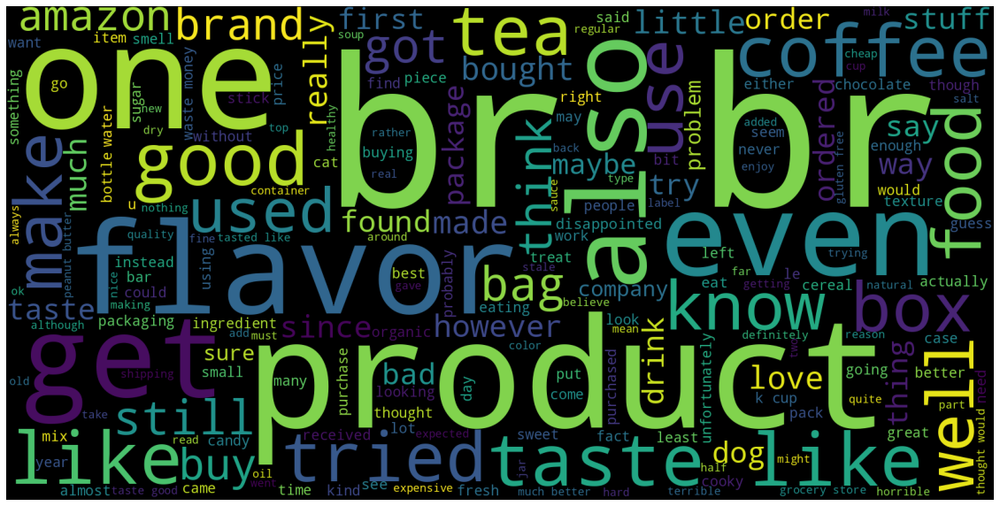

In [ ]:
plt.figure(1,figsize=(20,20))
plt.imshow(negative_wordcloud )
plt.axis('off')
plt.show();

In [ ]:
positive_df = X_train.loc[y_train==1, :]

words = ' '.join(positive_df['Review_clean_text'])

cleaned_word = " ".join([word for word in words.split()
                        if 'subject' not in word])

In [ ]:
positive_wordcloud = WordCloud(stopwords=stopwords.words("english"),
                      background_color='black',
                      width=1600,
                      height=800
                     ).generate(cleaned_word);

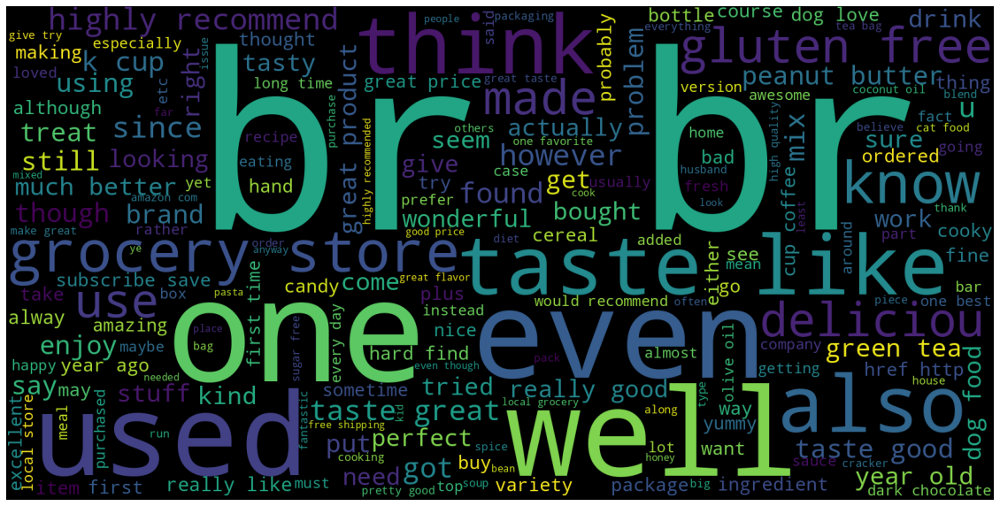

In [ ]:
plt.figure(1,figsize=(20,20))
plt.imshow(positive_wordcloud)
plt.axis('off')
plt.show();

**CONVERTING TEXT TO NUMERICAL VECTORS - BOW REPRESENTATION**

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

vocab = CountVectorizer()

X_train_trans = vocab.fit_transform(X_train['Review_clean_text'])
X_test_trans = vocab.transform(X_test['Review_clean_text'])

In [ ]:
X_train_trans

<270739x76417 sparse matrix of type '<class 'numpy.int64'>'
	with 8035932 stored elements in Compressed Sparse Row format>

In [ ]:
print("Total unique words:", len(vocab.vocabulary_))

print("Type of train features:", type(X_train_trans))

print("Shape of input data:", X_train_trans.shape)

Total unique words: 76417
Type of train features: <class 'scipy.sparse._csr.csr_matrix'>
Shape of input data: (270739, 76417)


In [ ]:
print(X_train_trans.shape)
print(X_test_trans.shape)

(270739, 76417)
(90247, 76417)


**Logistic Regression**

In [ ]:
from sklearn.linear_model import LogisticRegression
classifier = LogisticRegression()
classifier.fit(X_train_trans, y_train)

/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [ ]:
y_test_pred = classifier.predict(X_test_trans)

In [ ]:
from sklearn.metrics import accuracy_score
Accuracy_LR = accuracy_score(y_test, y_test_pred)
print('Accuracy :',Accuracy_LR)

Accuracy : 0.9244074595277405


**Decision Tree classifier**

In [ ]:
from sklearn.tree import DecisionTreeClassifier
classifier = DecisionTreeClassifier()
classifier.fit(X_train_trans, y_train)

DecisionTreeClassifier()

In [ ]:
y_test_pred = classifier.predict(X_test_trans)

In [ ]:
from sklearn.metrics import accuracy_score
Accuracy_DTC = accuracy_score(y_test, y_test_pred)
print('Accuracy :',Accuracy_DTC)

Accuracy : 0.8533136835573482


**Random Forest**

In [ ]:
from sklearn.ensemble import RandomForestClassifier
classifier = RandomForestClassifier()
classifier.fit(X_train_trans, y_train)

RandomForestClassifier()

In [ ]:
y_test_pred = classifier.predict(X_test_trans)

In [ ]:
from sklearn.metrics import accuracy_score
Accuracy_RF = accuracy_score(y_test, y_test_pred)
print('Accuracy :' ,Accuracy_RF)

Accuracy : 0.8831318492581471


**KNN Classifier**

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
classifier = KNeighborsClassifier()
classifier.fit(X_train_trans, y_train)

KNeighborsClassifier()

In [ ]:
y_test_pred = classifier.predict(X_test_trans)

/usr/local/lib/python3.8/dist-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


In [ ]:
from sklearn.metrics import accuracy_score
Accuracy_KNN = accuracy_score(y_test, y_test_pred)
print('Accuracy :',Accuracy_KNN )

Accuracy : 0.840659523308254


**Ramdom Forest Classifier**

In [ ]:
from sklearn.ensemble import RandomForestClassifier
classifier = RandomForestClassifier()
classifier.fit(X_train_trans, y_train)

RandomForestClassifier()

In [ ]:
y_test_pred = classifier.predict(X_test_trans)

In [ ]:
from sklearn.metrics import accuracy_score
Accuracy_RFC = accuracy_score(y_test, y_test_pred)
print('Accuracy: ',Accuracy_RFC )

Accuracy:  0.8836969649960663


**Gradient Boosting Classifier**

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
classifier = GradientBoostingClassifier()
classifier.fit(X_train_trans, y_train)


GradientBoostingClassifier()

In [ ]:
y_test_pred = classifier.predict(X_test_trans)
Accuracy_GBDT = accuracy_score(y_test, y_test_pred)
print('Accuracy: ',Accuracy_GBDT )

Accuracy:  0.8748767272042284


**Observation:**

In [ ]:
df_data = [['Logistic Regression', Accuracy_LR],
           ['Decision Tree Classifier', Accuracy_DTC],
           ['KNearestNeighbor Classifier', Accuracy_KNN],
           ['Random Forest Classifier ',Accuracy_RFC],
           ['Gradient Boosting Decision Tree Clasifier', Accuracy_GBDT]]

data = pd.DataFrame(df_data, columns = ['Algorithm','Accuracy_score'])
data

,Algorithm,Accuracy_score
0,Logistic Regression,0.924407
1,Decision Tree Classifier,0.853314
2,KNearestNeighbor Classifier,0.840660
3,Random Forest Classifier,0.883697
4,Gradient Boosting Decision Tree Clasifier,0.874877


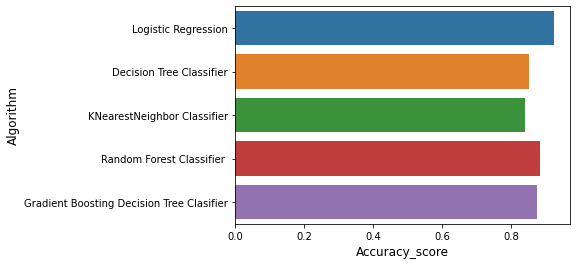

In [ ]:
plt.xlabel('Accuracy_score',fontsize = 12, color = 'black')
plt.ylabel('Algorithm',fontsize = 12, color = 'black')
sns.barplot(y=data.Algorithm, x = data.Accuracy_score);

 **Conclusion**
- By comparing all algorithm the Logistic Regression algorithm giving high or max accuracy score .
- **Logistic Regression** algorithm is the best model for prediction.